### Lab 2: General Concepts

In today's lab, we will work with data on cars sold at auction (Carvana Car Prediction). The target feature here is the presence of significant drawbacks hidden by the seller.

Carvana is a car reseller company, so its task is to prevent the purchase of cars with hidden drawbacks, since they are later harder to sell

## 1

Upload data about cars sold at auction. Look at the "raw" data.

View the file `DataDictionary-ru.txt` and understand what the columns of the matrix mean. Output statistics by column.

In [62]:
import pandas as pd

In [63]:
# place for code
data = pd.read_csv('data.csv')

## 2

Plot a scatter plot with `VehOdo` as the abscissa axis and the `MMRCurrentRetailAveragePrice` price as the ordinate axis. Mark vehicles with no drawbacks in green, and those with hidden drawbacks in red.

In [64]:
%matplotlib inline
import matplotlib.pyplot as plt

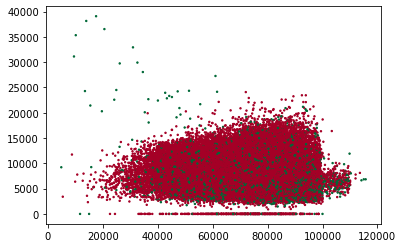

In [65]:
# place for code

plt.scatter(data['VehOdo'], data['MMRCurrentRetailAveragePrice'], c=data["IsBadBuy"],s=2, cmap='RdYlGn')

# Regression

## 3a

Import all machine learning models from the 'sklearn' library:

`from sklearn import *`

Treating the problem of predicting the presence of drawbacks as a regression problem, train a linear model [`LinearRegression`](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) on some subset of attributes (for example, `VehOdo` and `MMRCurrentRetailAveragePrice`).

What problem did you encounter? What solutions can you offer?

*Functions that can be useful:`.fit (), .loc[], pd.notnull()`*

*Creating a model:* `model1 = linear_model.LinearRegression()`

*Training:*
`model1.fit(x, y)`

In [66]:
# place for code
from sklearn import *
data = data.dropna()
model1 = linear_model.LinearRegression()
model1.fit(data.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']], data['IsBadBuy'])

LinearRegression()

## 3b

Make a prediction for all objects in the training sample and assign the result to the prediction variable

*Functions that may be useful: `model.predict()`*

In [67]:
# place for code
prediction = model1.predict(data.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']])
prediction

array([0.04585138, 0.02731311, 0.02558984, ..., 0.05317145, 0.04953968,
       0.05005049])

## 3c

Convert the resulting prediction vector `prediction` to the values `{0,1}`. This can be done, for example, using list comprehensions: https://docs.python.org/3/tutorial/datastructures.html#list-comprehensions 

`predictionClass = [1 if prediction[i] > 0.5 else 0 for i in range(prediction.shape[0])]`

In [68]:
# place for code
predictionClass = [1 if i > 0.5 else 0 for i in prediction]

## 3d

Build a classification quality report and an error matrix. How will the report and error matrix change if you change the threshold in task 3c (the default value is 0.5)?

*Functions that can be useful: `print(metrics.classification_report(...))`, `print(metrics.confusion_matrix(...))`*

The `classification_report` function calculates precision and recall for each class. Recall is the percentage of objects of this class that your prediction method also assigned to this class, among all objects of this class. Precision is the same, but only among all objects predicted for this class.

The `confusion_matrix` function returns a matrix with the number of objects. The columns of the matrix correspond to *predicted* classes, and the rows - to the *correct* classes. For example, the element M[0,1] is the number of machines, where in fact IsBadBuy = 0, and you predicted 1.

In [69]:
# place for code
print(metrics.classification_report(data['IsBadBuy'], predictionClass, labels=[0,1]))
print(metrics.confusion_matrix(data['IsBadBuy'], predictionClass))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      3151
           1       0.00      0.00      0.00       125

    accuracy                           0.96      3276
   macro avg       0.48      0.50      0.49      3276
weighted avg       0.93      0.96      0.94      3276

[[3151    0]
 [ 125    0]]
C:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Classification

## 4a
Treating the problem as a classification problem, build a classification model "decision tree" of depth 20 (everything is similar to linear regression).


*Functions that can be useful: `tree.DecisionTreeClassifier(max_depth=20) `*

In [70]:
# place for code
model2 = tree.DecisionTreeClassifier(max_depth=20)
model2.fit(data.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']], data['IsBadBuy'])

DecisionTreeClassifier(max_depth=20)

## 4b

The decision tree predicts probabilities. Use the built model to calculate the probability of hidden drawbacks.

*Functions that can be useful: `model.predict_proba() `*

In [71]:
# place for code
probabilities = model2.predict_proba(data.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']])
probabilities

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

## 4c

Convert the resulting probability matrix `probabilities` to the values `{0,1}`. Build a classification report and error matrix. Which method was better?

In [72]:
# place for code
prediction_probabilities = [0 if i > 0.5 else 1 for i in probabilities[:,0]]
print(metrics.classification_report(data['IsBadBuy'], prediction_probabilities, labels=[0,1]))
print(metrics.confusion_matrix(data['IsBadBuy'], prediction_probabilities))
# model2 is better than model1

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3151
           1       0.98      0.72      0.83       125

    accuracy                           0.99      3276
   macro avg       0.98      0.86      0.91      3276
weighted avg       0.99      0.99      0.99      3276

[[3149    2]
 [  35   90]]


# Cross-validation
## 5a


Divide the original sample into two parts, for example, using [slices](https://pythonz.net/references/named/slice/):

`dataTrain = data.loc[0:34999,]
dataTest = data.loc[35000:69999,]`

In [73]:
# place for code
dataTrain = data.loc[0:34999,] 
dataTest = data.loc[35000:69999,]

## 5b

Train the decision tree on `dataTrain` and apply it to `dataTrain` and `dataTest`, calculating the prediction accuracy for each case. 

Perform several experiments for different tree depths. Write in the comments for which depths the model is under-trained, for which it is over-trained, and where the early stopping point is.

*Functions that can be useful: `metrics.accuracy_score() `*

In [74]:
# place for code
model3 = tree.DecisionTreeClassifier(max_depth=3)
model3.fit(dataTrain.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']], dataTrain['IsBadBuy'])

train_prediction_prob= model3.predict_proba(dataTrain.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']])
test_prediction_prob= model3.predict_proba(dataTest.loc[:,['VehOdo','MMRCurrentRetailAveragePrice']])

train_probabilities_class = [0 if i > 0.5 else 1 for i in train_prediction_prob[:,0]]
test_probabilities_class = [0 if i > 0.5 else 1 for i in test_prediction_prob[:,0]]

train_accuracy = metrics.accuracy_score( dataTrain['IsBadBuy'], train_probabilities_class )
test_accuracy = metrics.accuracy_score( dataTest['IsBadBuy'], test_probabilities_class )

print(train_accuracy)
print(test_accuracy)

# max_depth=3 is the best. anything below or above 3 will result worse

0.9699338544798557
0.9579158316633266


# Decision function
## 6a

Let's return to the model of the decision tree of depth 20, built over the entire training sample `data`. Let the price of the error of incorrect prediction 0 be 1000, and the price of incorrect prediction 1 be 100.

Calculate the loss function - the average error for the entire training sample.

In [79]:
# place for code
one_errors = [1 if data['IsBadBuy'].tolist()[i]==1 and prediction_probabilities[i]==0 else 0 for i in range(len(data['IsBadBuy']))]
zero_errors = [1 if data['IsBadBuy'].tolist()[i]==0 and prediction_probabilities[i]==1 else 0 for i in range(len(data['IsBadBuy']))]
total = (sum(one_errors)*100) + (sum(zero_errors)*1000)

print('Number of incorrect predictions of 0: {o}'.format(o=sum(zero_errors)))
print('Number of incorrect predictions of 1: {o}'.format(o=sum(one_errors)))
print('Total Loss: {t}'.format(t=total))
print( 'Average: {avg}'.format( avg = total/len(data['IsBadBuy']) ) )

metrics.zero_one_loss(data['IsBadBuy'],prediction_probabilities,normalize=False)

Number of incorrect predictions of 0: 2
Number of incorrect predictions of 1: 35
Total Loss: 5500
Average: 1.678876678876679


37

## 6b

Find out how to change the decision function `[0 if predictionProb[i][0] > 0.5 else 1 for i in range(prediction.shape[0])]` so that the total loss be minimal?

Find the optimal decision function and the minimum value of the total loss using the brute force method or using the formula from lecture 2 (slide Decision function).



In [82]:
# place for code
zero_fail_rate = sum(zero_errors) / len(data['IsBadBuy'])

optimized_prediction_probabilities = [0 if i[0] > zero_fail_rate else 1 for i in probabilities]

one_errors2 = [1 if data['IsBadBuy'].tolist()[i]==1 and optimized_prediction_probabilities[i]==0 else 0 for i in range(len(data['IsBadBuy']))]
zero_errors2 = [1 if data['IsBadBuy'].tolist()[i]==0 and optimized_prediction_probabilities[i]==1 else 0 for i in range(len(data['IsBadBuy']))]
total2 = (sum(one_errors2)*100) + (sum(zero_errors2)*1000)

print('Number of incorrect predictions of 0: {o}'.format(o=sum(zero_errors2)))
print('Number of incorrect predictions of 1: {o}'.format(o=sum(one_errors2)))
print('Total Loss: {t}'.format(t=total2))
print( 'Average: {avg}'.format( avg = total2/len(data['IsBadBuy']) ) )

metrics.zero_one_loss(data['IsBadBuy'], optimized_prediction_probabilities,normalize=False)


Number of incorrect predictions of 0: 0
Number of incorrect predictions of 1: 37
Total Loss: 3700
Average: 1.1294261294261294


37